In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import pandas as pd
import seaborn as sns




ModuleNotFoundError: No module named 'cv2'

## Design and Development

### Loading images



In [ ]:
# Get the current working directory
path = os.getcwd()

# Create a dictionary to store image data for different datasets
image_data = {
    'noisy10': [],
    'noisy25': [],
    'noisy50': [],
}

# Iterate through folders in the current directory
for folder in os.listdir(path):
    # Check if the folder name starts with 'noisy'
    if folder.startswith('noisy'):
        # Construct the full path to the folder
        image_path = os.path.join(path, folder)
        
        # Iterate through files in the folder
        for file in os.listdir(image_path):
            # Construct the full path to the image file
            image_file_path = os.path.join(image_path, file)
            
            # Read the image using matplotlib (plt.imread)
            image = plt.imread(image_file_path)
            
            # Append the image to the corresponding dataset in the dictionary
            image_data[folder].append(image)

# Now, the image_data dictionary contains images for different noisy datasets

In [ ]:


def display_images(dataset):
    fig, axs = plt.subplots(5,5 ,figsize=(15,10))
    images = image_data[dataset]
    for i, image in enumerate(images):
        ax = axs[i//5, i%5]
        ax.imshow(image,cmap='gray')
        ax.axis('off')
    fig.suptitle(f'Images in {dataset} dataset')


### Images in dataset displayed...

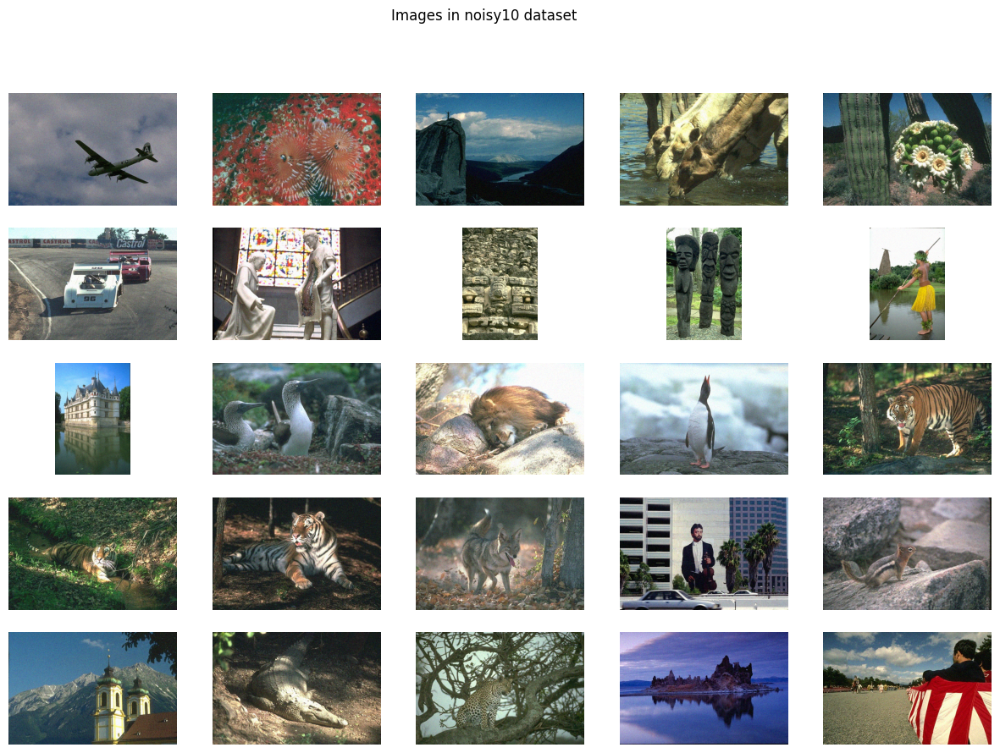

In [ ]:
display_images('noisy10')

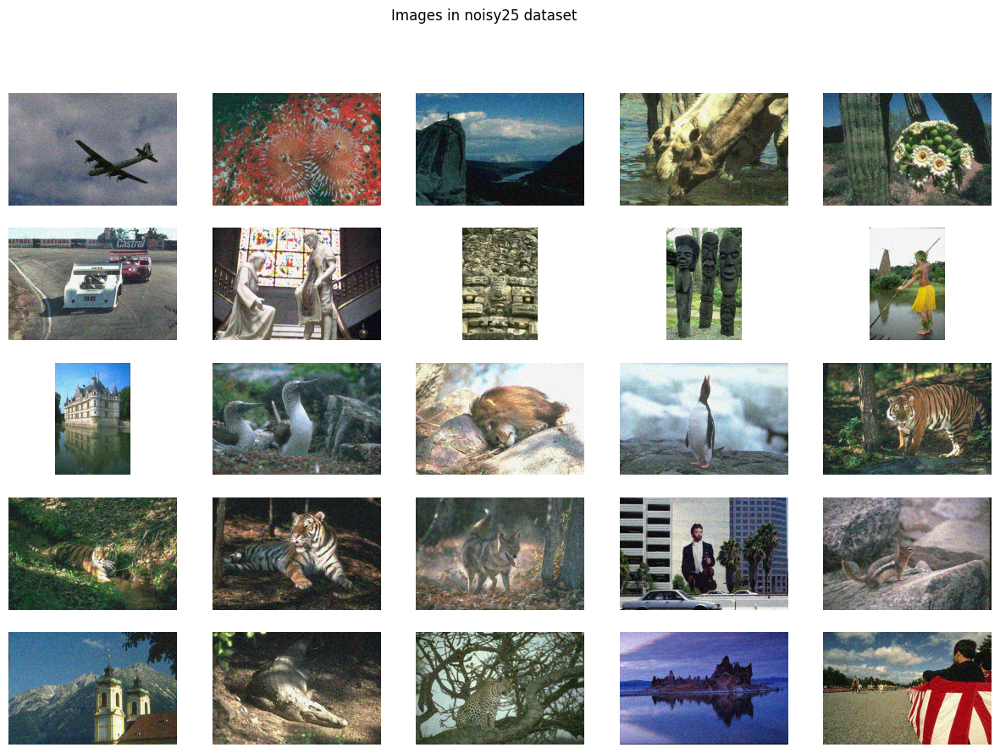

In [ ]:
display_images('noisy25')


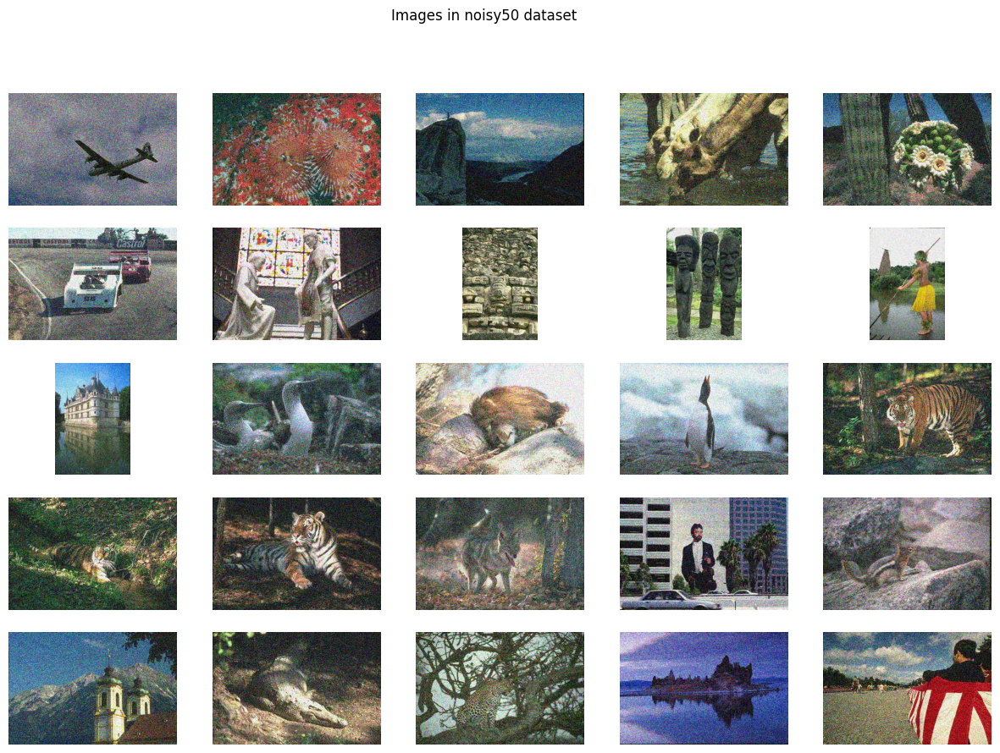

In [ ]:
display_images('noisy50')

### EDA on Images

### Pre-processing

#### Image shape analysis

In [ ]:
def plot_channel_distribution(dataset):
    # Initialize a list to store the number of channels in each image
    image_shape = []

    # Iterate through files in the dataset
    for file in os.listdir(dataset):
        # Construct the full path to the image file
        image_file_path = os.path.join(dataset, file)
        
        # Read the image using matplotlib (plt.imread)
        image = plt.imread(image_file_path)
        
        # Append the number of channels to the list
        image_shape.append(image.shape[2])
    
    # Convert the list to a NumPy array for easier analysis
    return np.array(image_shape)

# Call the function for each dataset
d1_channels = plot_channel_distribution('noisy10')
d2_channels = plot_channel_distribution('noisy25')
d3_channels = plot_channel_distribution('noisy50')

# Now, d1_channels, d2_channels, and d3_channels contain the number of channels for each image in their respective datasets

Text(0.5, 1.0, "Countplot to show number of channels in 'noisy10' dataset")

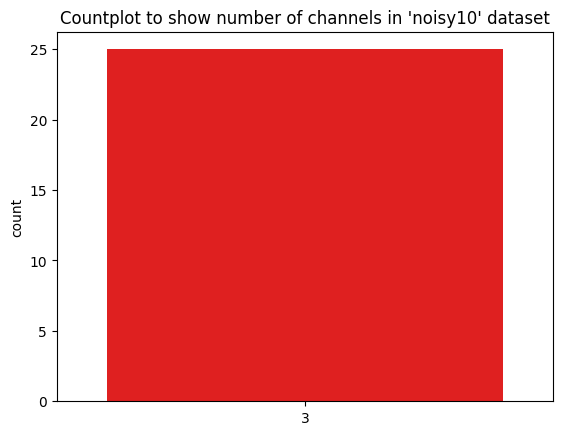

In [ ]:
d1_channels_plot = sns.countplot(x=d1_channels,color='red')
d1_channels_plot.set_title("Countplot to show number of channels in 'noisy10' dataset")

Text(0.5, 1.0, "Countplot to show number of channels in 'noisy25' dataset")

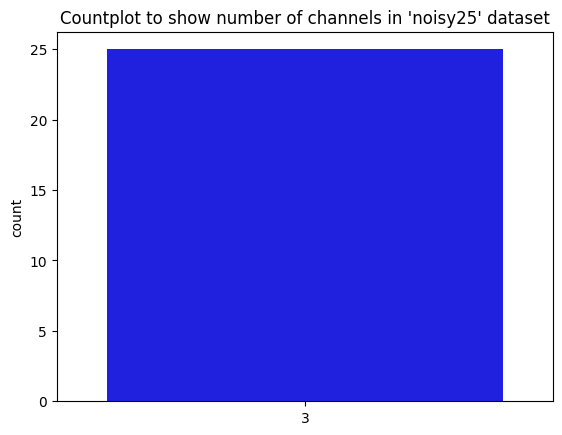

In [ ]:
d2_channels_plot = sns.countplot(x=d2_channels,color='blue')
d2_channels_plot.set_title("Countplot to show number of channels in 'noisy25' dataset")

Text(0.5, 1.0, "Countplot to show number of channels in 'noisy50' dataset")

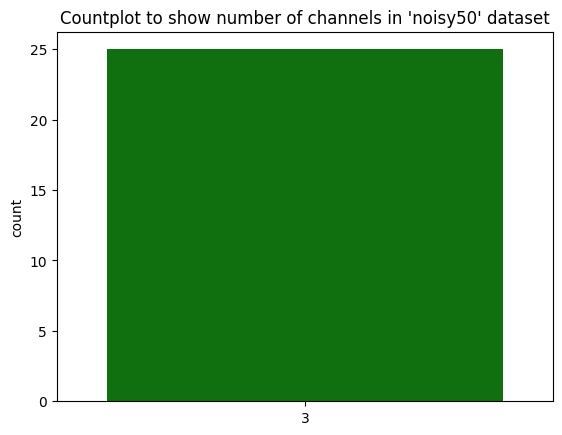

In [ ]:
d3_channels_plot = sns.countplot(x=d3_channels,color='green')
d3_channels_plot.set_title("Countplot to show number of channels in 'noisy50' dataset")

#### Image Resolution/ Channels Distribution Analysis

In [ ]:
# List of dataset names
datasets = ['noisy10', 'noisy25', 'noisy50']

def return_image_shape_array(datasets):
    # Initialize a list to store image shapes
    image_shape_array = []

    # Iterate through datasets
    for dataset in datasets:
        # Get the list of images for the current dataset
        images = image_data[dataset]
        
        # Iterate through images in the dataset
        for image in images:
            # Append the shape of the image to the list
            image_shape_array.append(image.shape)
    
    # Convert the list to a Pandas DataFrame for easier analysis
    return image_shape_array

# Call the function to get the image shapes for all datasets
image_shape_df = pd.DataFrame(return_image_shape_array(datasets))

# Display the value counts of different image shapes
image_shape_df.value_counts()

# Now, image_shape_df contains the image shapes for all images in the specified datasets

0    1    2
321  481  3    63
481  321  3    12
Name: count, dtype: int64

### Evaulation Metrics Utility

In [ ]:
from skimage.metrics import mean_squared_error
from skimage.metrics import structural_similarity as ssim


def calculate_psnr(original_image, denoised_image):
    # Convert images to float32
    original_image = original_image.astype(np.float32)
    denoised_image = denoised_image.astype(np.float32)

    # Calculate MSE (Mean Squared Error)
    mse = np.mean((original_image - denoised_image) ** 2)

    # If MSE is zero, PSNR is infinity
    if mse == 0:
        return float('inf')

    # Calculate PSNR using the formula: PSNR = 20 * log10(MAX_I) - 10 * log10(MSE)
    max_intensity = 255.0
    psnr = 20 * np.log10(max_intensity) - 10 * np.log10(mse)

    return psnr.round(2)

# Function to calculate Mean Squared Error (MSE) between two images
def calculate_mse(image1, image2):
    # Using mean_squared_error from scikit-learn
    return mean_squared_error(image1, image2).round(2)

# Function to calculate Structural Similarity Index (SSIM) between two images
def calculate_ssim(image1, image2):
    # Convert images to grayscale
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Calculate SSIM using ssim function from scikit-image
    (ssim_value, diff) = ssim(image1, image2, full=True, multichannel=True)

    # Return SSIM value rounded to 2 decimal places and the difference image
    return (ssim_value.round(2), diff)

# Now, these functions can be used to calculate MSE and SSIM between two images

### Denoising Algorithm

In [ ]:
from skimage.metrics import structural_similarity as ssim

def denoise_color_fourier(image_path_noisy, image_path_original, r):
    # Read the noisy color image
    noisy_image = cv2.imread(image_path_noisy, cv2.IMREAD_COLOR)
    og = cv2.imread(image_path_original,cv2.IMREAD_COLOR)


    # Apply Fourier Transform to each color channel
    channels = cv2.split(noisy_image)
    denoised_channels = []

    for channel in channels:
        # Apply Fourier Transform
        f_transform = np.fft.fft2(channel)
        f_shift = np.fft.fftshift(f_transform)

        # Create a mask to filter out high-frequency noise
        rows, cols = channel.shape
        center_row, center_col = rows // 2, cols // 2
        x, y = np.ogrid[:rows, :cols]

        mask = np.zeros((rows, cols), np.uint8)
        center = [center_row, center_col]

        mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
        mask[mask_area] = 1

        # Apply the mask to the Fourier Transform
        f_shift_filtered = f_shift * mask

        # Apply Inverse Fourier Transform
        f_ishift = np.fft.ifftshift(f_shift_filtered)
        denoised_channel = np.real(np.fft.ifft2(f_ishift))


        # Optional: Clip values to ensure they are in the valid range (0-255)
        denoised_channel = np.clip(denoised_channel, 0, 255).astype(np.uint8)

        denoised_channels.append(denoised_channel)

    # Combine denoised color channels
    denoised_image = cv2.merge(denoised_channels)

    blurred_channels = [cv2.GaussianBlur(channel,(3,3), sigmaX=0) for channel in cv2.split(denoised_image)]
    denoised_image = cv2.merge(blurred_channels)

    bilateral_channels = [cv2.bilateralFilter(channel, d=9, sigmaColor=75, sigmaSpace=75) for channel in cv2.split(denoised_image)]
    denoised_image = cv2.merge(bilateral_channels)

    

    # Display the results
    plt.figure(figsize=(20, 10))


    plt.subplot(231), plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title('Noisy Image')
    plt.xlabel(f'MSE: {calculate_mse(noisy_image,og)}, SSIM: {calculate_ssim(noisy_image,og)[0]}, PSNR: {calculate_psnr(noisy_image,og)}')

    plt.subplot(232), plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
    plt.title('Denoised Image')
    plt.xlabel(f'MSE: {calculate_mse(denoised_image,og)}, SSIM: {calculate_ssim(denoised_image,og)[0]}, PSNR: {calculate_psnr(denoised_image,og)} R={r}')

    plt.subplot(233), plt.imshow(cv2.cvtColor(og, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.xlabel(f'MSE: {calculate_mse(og,og)}, SSIM: {calculate_ssim(og,og)[0]}, PSNR: {calculate_psnr(og,og)}')

    return denoised_image


In [ ]:
### Finding optimum R value

In [ ]:
def generate_metric_values(original_image_path, noisy_image_path):
    # Define a set of radius values
    r_values = [10, 50, 100, 110]

    # Lists to store the results for each radius
    mse_results = []
    ssim_results = []
    psnr_results = []

    # Iterate through each radius value
    for r in r_values:
        # Read the original image
        original_image = cv2.imread(original_image_path, cv2.IMREAD_COLOR)

        # Generate the denoised image using the custom Fourier denoising algorithm
        denoised_image = denoise_color_fourier(noisy_image_path, original_image_path, r)

        # Calculate SSIM, MSE, and PSNR values between denoised and original images
        ssim_value = calculate_ssim(denoised_image, original_image)[0]
        mse_value = calculate_mse(denoised_image, original_image)
        psnr_value = calculate_psnr(denoised_image, original_image)

        # Append the results to the respective lists
        mse_results.append(mse_value)
        ssim_results.append(ssim_value)
        psnr_results.append(psnr_value)

    # Return the results as a tuple
    return (mse_results, ssim_results, r_values, psnr_results)

# Example usage:
# (mse_results, ssim_results, r_values, psnr_results) = generate_metric_values('original/0004.png', 'noisy50/0004.png')


Text(0.5, 1.0, 'A Lineplot to show the relationship between MSE and R')

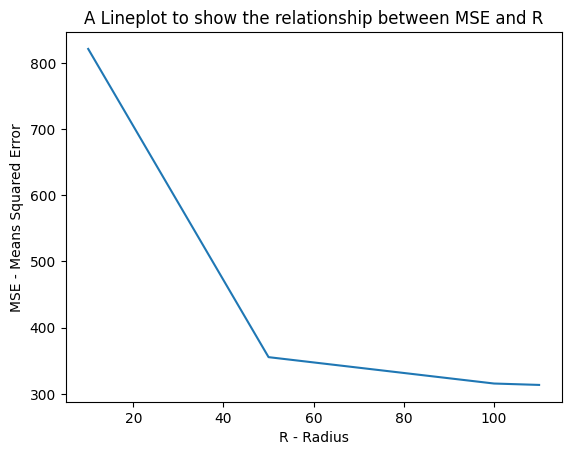

In [ ]:
mse_plot = sns.lineplot(x=r_values, y=mse_results)
mse_plot.set_ylabel('MSE - Means Squared Error')
mse_plot.set_xlabel('R - Radius')
mse_plot.set_title('A Lineplot to show the relationship between MSE and R')

Text(0.5, 1.0, 'A Lineplot to show the relationship between SSIM and R')

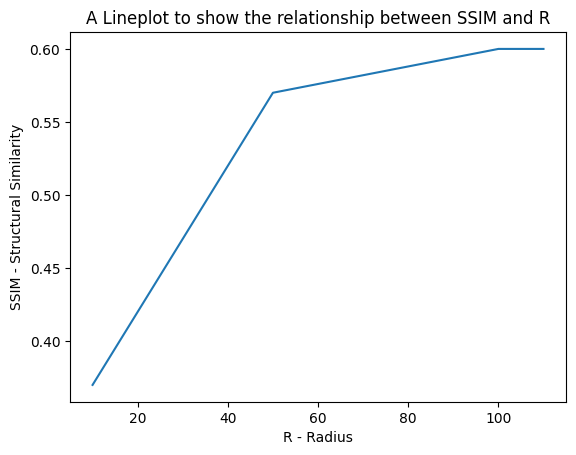

In [ ]:
ssim_plot = sns.lineplot(x=r_values, y=ssim_results)
ssim_plot.set_ylabel('SSIM - Structural Similarity')
ssim_plot.set_xlabel('R - Radius')
ssim_plot.set_title('A Lineplot to show the relationship between SSIM and R')

Text(0.5, 1.0, 'A Lineplot to show the relationship between PNSR and R')

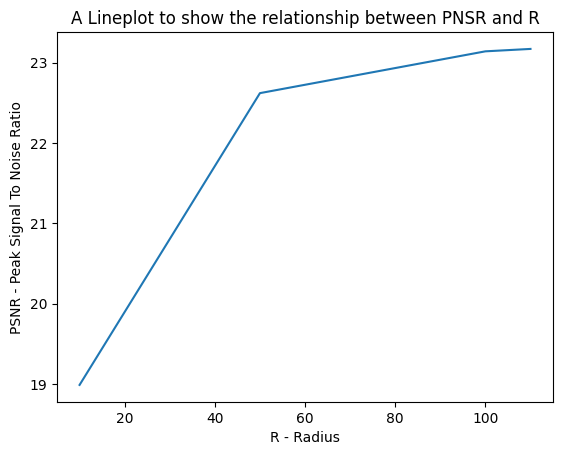

In [ ]:
psnr_plot = sns.lineplot(x=r_values, y=psnr_results)
psnr_plot.set_ylabel('PSNR - Peak Signal To Noise Ratio')
psnr_plot.set_xlabel('R - Radius')
psnr_plot.set_title('A Lineplot to show the relationship between PNSR and R')

## Algorithm Comparison

### Median filter

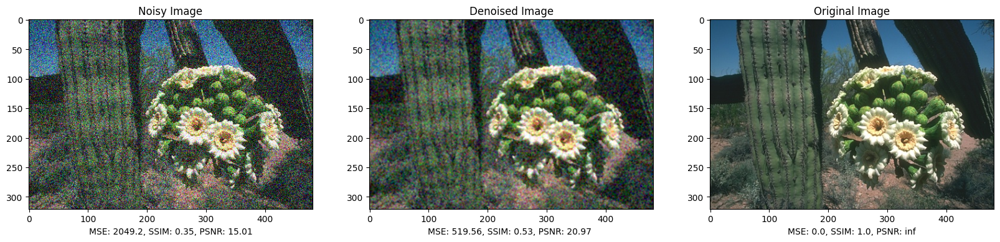

In [ ]:
def denoise_mean_color(image_path_noisy, image_path_original, kernel_size=3):
    # Read the noisy color image
    noisy_image = cv2.imread(image_path_noisy, cv2.IMREAD_COLOR)
    original_image = cv2.imread(image_path_original, cv2.IMREAD_COLOR)

    # Split the image into individual color channels
    b, g, r = cv2.split(noisy_image)

    # Apply mean filter to each channel
    denoised_b = cv2.medianBlur(b, ksize=kernel_size)
    denoised_g = cv2.medianBlur(g, ksize=kernel_size)
    denoised_r = cv2.medianBlur(r, ksize=kernel_size)

    # Merge the denoised channels back into a color image
    denoised_image = cv2.merge([denoised_b, denoised_g, denoised_r])

    # Display the results
    plt.figure(figsize=(20, 10))

    plt.subplot(231), plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title('Noisy Image')
    plt.xlabel(f'MSE: {calculate_mse(noisy_image,original_image)}, SSIM: {calculate_ssim(noisy_image,original_image)[0]}, PSNR: {calculate_psnr(noisy_image,original_image)}')

    plt.subplot(232), plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
    plt.title('Denoised Image')
    plt.xlabel(f'MSE: {calculate_mse(denoised_image,original_image)}, SSIM: {calculate_ssim(denoised_image,original_image)[0]}, PSNR: {calculate_psnr(denoised_image,original_image)} ')

    plt.subplot(233), plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.xlabel(f'MSE: {calculate_mse(original_image,original_image)}, SSIM: {calculate_ssim(original_image,original_image)[0]}, PSNR: {calculate_psnr(original_image,original_image)}')



    return denoised_image

# Example usage
denoised_image = denoise_mean_color('noisy50/0004.png', 'original/0004.png', kernel_size=3)

### Mean filter

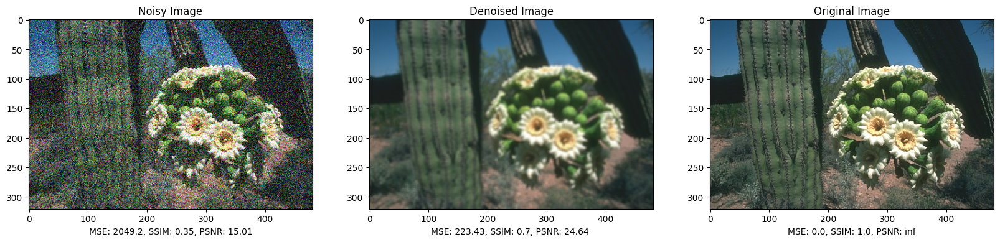

In [ ]:

def mean_filter_color(image_path_noisy, image_path_original, kernel_size=3):
    # Read the color image
    noisy_image = cv2.imread(image_path_noisy, cv2.IMREAD_COLOR)
    original_image = cv2.imread(image_path_original, cv2.IMREAD_COLOR)

    # Split the image into color channels
    b, g, r = cv2.split(original_image)

    # Apply mean filter to each channel
    b_blurred = cv2.blur(b, (kernel_size, kernel_size))
    g_blurred = cv2.blur(g, (kernel_size, kernel_size))
    r_blurred = cv2.blur(r, (kernel_size, kernel_size))

    # Merge the color channels back together
    denoised_image = cv2.merge([b_blurred, g_blurred, r_blurred])

    # Display the results
    plt.figure(figsize=(20, 10))

    plt.subplot(231), plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title('Noisy Image')
    plt.xlabel(f'MSE: {calculate_mse(noisy_image,original_image)}, SSIM: {calculate_ssim(noisy_image,original_image)[0]}, PSNR: {calculate_psnr(noisy_image,original_image)}')

    plt.subplot(232), plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
    plt.title('Denoised Image')
    plt.xlabel(f'MSE: {calculate_mse(denoised_image,original_image)}, SSIM: {calculate_ssim(denoised_image,original_image)[0]}, PSNR: {calculate_psnr(denoised_image,original_image)} ')

    plt.subplot(233), plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.xlabel(f'MSE: {calculate_mse(original_image,original_image)}, SSIM: {calculate_ssim(original_image,original_image)[0]}, PSNR: {calculate_psnr(original_image,original_image)}')

    return denoised_image

# Example usage
denoised_image = mean_filter_color('noisy50/0004.png','original/0004.png', kernel_size=5)

### Wavelet denoising

In [ ]:
# Import necessary libraries
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage import img_as_ubyte

def wavelet_denoise_image(image_path_noisy, image_path_original, method='bayes'):
    # Read the noisy and original images
    noisy_image = cv2.imread(image_path_noisy, cv2.IMREAD_COLOR)
    original_image = cv2.imread(image_path_original, cv2.IMREAD_COLOR)

    # Estimate the noise standard deviation
    sigma_est = estimate_sigma(noisy_image, channel_axis=-1, average_sigmas=True)

    # Apply wavelet denoising based on the specified method
    if method == 'bayes':
        denoised_image_bayes = denoise_wavelet(noisy_image, channel_axis=-1, convert2ycbcr=True,
                                               method='BayesShrink', mode='soft', rescale_sigma=True)
        denoised_image_bayes = img_as_ubyte(denoised_image_bayes)
        denoised_image = denoised_image_bayes
    elif method == 'visushrink':
        denoised_image_visushrink = denoise_wavelet(noisy_image, channel_axis=-1, convert2ycbcr=True,
                                                    method='VisuShrink', mode='hard', sigma=sigma_est,
                                                    rescale_sigma=True)
        denoised_image_visushrink = img_as_ubyte(denoised_image_visushrink)
        denoised_image = denoised_image_visushrink

    # Display the original, noisy, and denoised images
    plt.figure(figsize=(20, 10))

    plt.subplot(231), plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title('Noisy Image')
    plt.xlabel(f'MSE: {calculate_mse(noisy_image, original_image)}, SSIM: {calculate_ssim(noisy_image, original_image)[0]}, PSNR: {calculate_psnr(noisy_image, original_image)}')

    plt.subplot(232), plt.imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Denoised Image {method} Method')
    plt.xlabel(f'MSE: {calculate_mse(denoised_image, original_image)}, SSIM: {calculate_ssim(denoised_image, original_image)[0]}, PSNR: {calculate_psnr(denoised_image, original_image)} ')

    plt.subplot(233), plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.xlabel(f'MSE: {calculate_mse(original_image, original_image)}, SSIM: {calculate_ssim(original_image, original_image)[0]}, PSNR: {calculate_psnr(original_image, original_image)}')

    return denoised_image

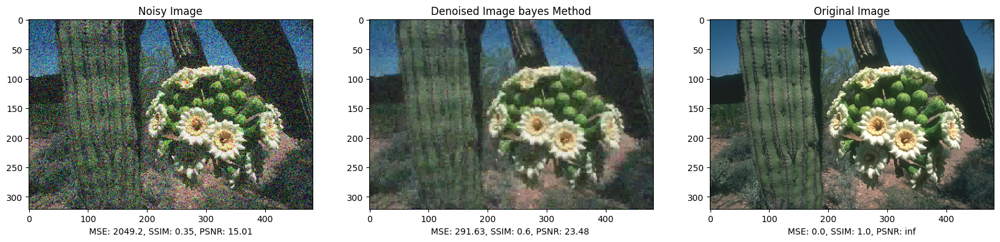

In [ ]:
denoised_image = wavelet_denoise_image('noisy50/0004.png','original/0004.png','bayes')

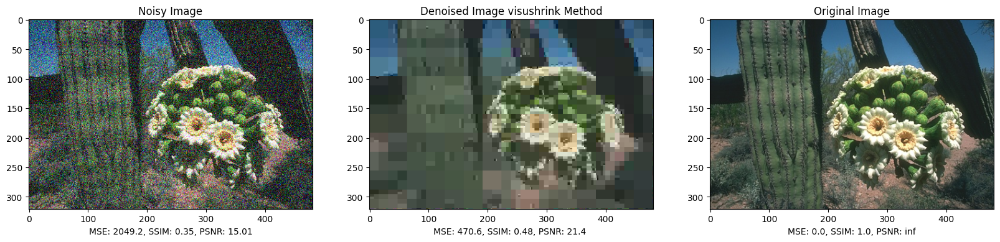

In [ ]:
denoised_image = wavelet_denoise_image('noisy50/0004.png','original/0004.png','visushrink')